# Flowers 분류기

In [1]:
import warnings
warnings.filterwarnings("ignore")

## 1. 직접 만드는 분류기

In [2]:
import tensorflow as tf
print(tf.__version__)

2.6.0


### Step 1. 데이터셋 내려받기

tensorflow_datasets 라이브러리 중 tf_flowers 데이터 사용

1️⃣ 기본적인 tfds.load() 사용

※ 그 외 방법

- Kaggle에서 직접 데이터셋을 다운로드하여 사용(Kaggle API를 사용)
    - tfds.load()를 사용하지 않고 로컬 데이터셋을 직접 로드 가능.
    - 데이터셋을 자유롭게 변형 가능 (ex: 증강, 전처리 추가 가능).
- TensorFlow 공식 데이터 다운로드 (tensorflow.keras.utils.get_file)
    - TensorFlow의 get_file()을 사용하여 Microsoft에서 제공하는 데이터셋을 직접 다운로드
    - MS에서 제공하는 공식 데이터 사용
- OpenCV 또는 PIL을 사용하여 로컬 데이터 직접 로드
    - 로컬 디렉터리에서 OpenCV(cv2) 또는 PIL을 사용하여 직접 데이터를 로드
    - 데이터셋을 커스텀 처리 가능

In [3]:
import tensorflow_datasets as tfds
tfds.__version__

'4.4.0'

In [4]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir='/mnt/e/aiffel/HelloWorld/flower/',
    download=True,
    with_info=True,
    as_supervised=True,
)

print(metadata)

Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset tf_flowers downloaded and prepared to /mnt/e/aiffel/HelloWorld/flower/tf_flowers/3.0.1. Subsequent calls will reuse this data.
tfds.core.DatasetInfo(
    name='tf_flowers',
    full_name='tf_flowers/3.0.1',
    description="""
    A large set of images of flowers
    """,
    homepage='https://www.tensorflow.org/tutorials/load_data/images',
    data_path='/mnt/e/aiffel/HelloWorld/flower/tf_flowers/3.0.1',
    download_size=218.21 MiB,
    dataset_size=221.83 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=5),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=3670, num_shards=2>,
    },
    citation="""@ONLINE {tfflowers,
    author = "The TensorFlow Team",
    title = "Flowers",
    month = "jan",
    year = "2019",
    url = "http://download.tensorflow.org/example_images/flower_photos.

.cardinality() 사용: TensorFlow에서 데이터셋의 크기를 계산하는 가장 효율적인 방법

In [5]:
num_samples = raw_train.cardinality().numpy()  # 데이터셋 크기 계산
print(f"Train : {num_samples}")

Train : 2936


In [6]:
print(f"Validation : {len(list(raw_validation))}")
print(f"Test : {len(list(raw_test))}")

Validation : 367
Test : 367


<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


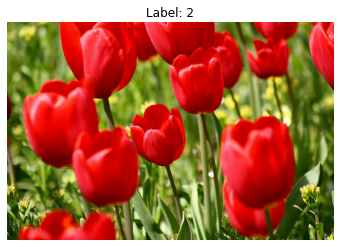

In [7]:
print(raw_train)
print(raw_validation)
print(raw_test)

import tensorflow as tf
import matplotlib.pyplot as plt

# 데이터셋에서 샘플 가져오기
for image, label in raw_train.take(1):
    plt.imshow(image)
    plt.title(f"Label: {label.numpy()}")
    plt.axis("off")
    plt.show()

o 데이터 시각화를 통해 확인하고, 모델에 입력할 수 있는 형태로 전처리하기

In [8]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

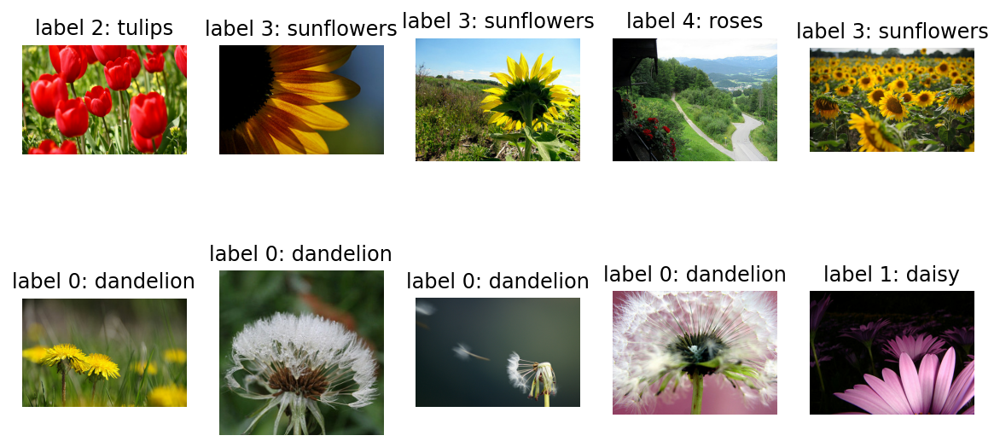

In [93]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져오기
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

1. 10장 사진 확인 결과

    - label 0 : dandelion
    - label 1 : daisy
    - label 2 : tulips
    - label 3 : sunflower
    - label 4 : roses

2. 이미지의 사이즈는 전부 제각각 -> 160x160 픽셀로 통일

### Step 2. 데이터셋을 모델에 넣을 수 있는 형태로 준비하기

이미지를 모두 같은 크기로 formatting 한 후, train_batches, validation_batches, test_batches를 준비

#### o train, validataion, test 데이터셋으로 변환 
preprocess_image() 함수를 raw_train, raw_validation, raw_test 에 map() 함수 적용 

In [10]:
IMG_SIZE = 160
BATCH_SIZE = 32

def preprocess_image(image, label):
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))  # 크기 조정
    image = tf.cast(image, tf.float32)  # float32 변환
    image = (image / 127.5) - 1  # 픽셀값 정규화 (-1 ~ 1)
    return image, label

train = raw_train.map(preprocess_image)
validation = raw_validation.map(preprocess_image)
test = raw_test.map(preprocess_image)

In [11]:
print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


In [12]:
num_samples = train.cardinality().numpy()  # 데이터셋 크기 계산
print(f"Train : {num_samples}")

num_samples = validation.cardinality().numpy()  # 데이터셋 크기 계산
print(f"validation : {num_samples}")

num_samples = test.cardinality().numpy()  # 데이터셋 크기 계산
print(f"test : {num_samples}")

Train : 2936
validation : 367
test : 367


#### 이미지 시각화 

    - matplotlib으로 할 경우에는 모든 픽셀값이 양수 
    - image = (image + 1) / 2 
        - 1~1 사이의 픽셀값을 1을 더한 후 2로 나눠서 0~1 사이의 값으로 변환


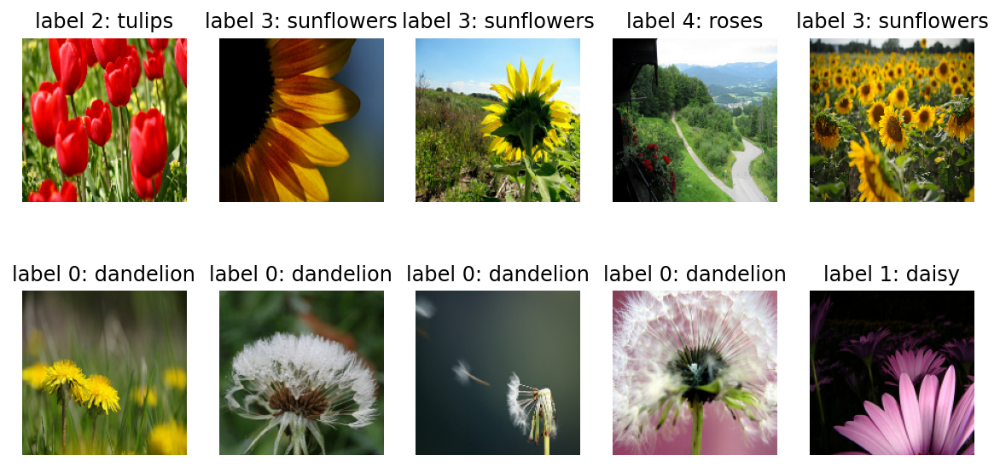

In [13]:
plt.figure(figsize=(10, 5))

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

### Step 3. 모델 설계하기

#### 텐서플로우를 활용해 모델 구조 설계하기

In [14]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

In [27]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])

In [16]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

### Step 4. 모델 학습시키기

In [28]:
BATCH_SIZE = 64             # 32, 64
SHUFFLE_BUFFER_SIZE = 1000

#### 방법1. RMSprop, sparse_categorical_crossentropy, learning_rate=0.0001

EPOCHS = 30 / batch = 32   ->  Test Loss: 1.1969, Test Accuracy: 66.21 %

         50 / batch = 64   ->  Test Loss: 0.8001, Test Accuracy: 74.66 %
         
         80 / batch = 64   ->  Test Loss: 1.2005, Test Accuracy: 71.93 %

In [29]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [30]:
# 데이터 증강 함수
def augment_image(image, label):
    image = tf.image.random_flip_left_right(image)  # 좌우 반전
    image = tf.image.random_brightness(image, max_delta=0.2)  # 밝기 조정
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)  # 대비 조정
    # image = tf.image.random_zoom(image, (0.8, 1.2))  # 랜덤 줌 (비율)
    return image, label

In [31]:
# 데이터 변환 및 배치 적용
train_batches = raw_train.map(preprocess_image).map(augment_image).batch(BATCH_SIZE).shuffle(1000)
validation_batches = raw_validation.map(preprocess_image).batch(BATCH_SIZE)
test_batches = raw_test.map(preprocess_image).batch(BATCH_SIZE)

In [32]:
EPOCHS = 80                                        # 30  -> Test Loss: 1.1969, Test Accuracy: 66.21 %
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/80
46/46 [==============================] - 3s 33ms/step - loss: 1.6499 - accuracy: 0.3355 - val_loss: 1.2516 - val_accuracy: 0.5014
Epoch 2/80
46/46 [==============================] - 3s 30ms/step - loss: 1.2153 - accuracy: 0.4959 - val_loss: 1.1082 - val_accuracy: 0.5259
Epoch 3/80
46/46 [==============================] - 3s 30ms/step - loss: 1.1194 - accuracy: 0.5358 - val_loss: 1.0518 - val_accuracy: 0.5913
Epoch 4/80
46/46 [==============================] - 3s 30ms/step - loss: 1.0358 - accuracy: 0.5688 - val_loss: 1.0875 - val_accuracy: 0.5286
Epoch 5/80
46/46 [==============================] - 3s 30ms/step - loss: 0.9728 - accuracy: 0.6209 - val_loss: 0.9702 - val_accuracy: 0.6158
Epoch 6/80
46/46 [==============================] - 3s 30ms/step - loss: 0.9240 - accuracy: 0.6424 - val_loss: 0.9566 - val_accuracy: 0.5831
Epoch 7/80
46/46 [==============================] - 3s 30ms/step - loss: 0.8894 - accuracy: 0.6659 - val_loss: 0.9697 - val_accuracy: 0.5749
Epoch 8/80
46

Epoch 59/80
46/46 [==============================] - 3s 30ms/step - loss: 0.0447 - accuracy: 0.9905 - val_loss: 1.1912 - val_accuracy: 0.6785
Epoch 60/80
46/46 [==============================] - 3s 30ms/step - loss: 0.0361 - accuracy: 0.9908 - val_loss: 1.2370 - val_accuracy: 0.6621
Epoch 61/80
46/46 [==============================] - 3s 30ms/step - loss: 0.0547 - accuracy: 0.9901 - val_loss: 1.1981 - val_accuracy: 0.6785
Epoch 62/80
46/46 [==============================] - 3s 30ms/step - loss: 0.0249 - accuracy: 0.9963 - val_loss: 1.3702 - val_accuracy: 0.6757
Epoch 63/80
46/46 [==============================] - 3s 30ms/step - loss: 0.0484 - accuracy: 0.9871 - val_loss: 1.2118 - val_accuracy: 0.6649
Epoch 64/80
46/46 [==============================] - 3s 30ms/step - loss: 0.0303 - accuracy: 0.9932 - val_loss: 2.6109 - val_accuracy: 0.5777
Epoch 65/80
46/46 [==============================] - 3s 30ms/step - loss: 0.0504 - accuracy: 0.9843 - val_loss: 1.2357 - val_accuracy: 0.6839
Epoch 

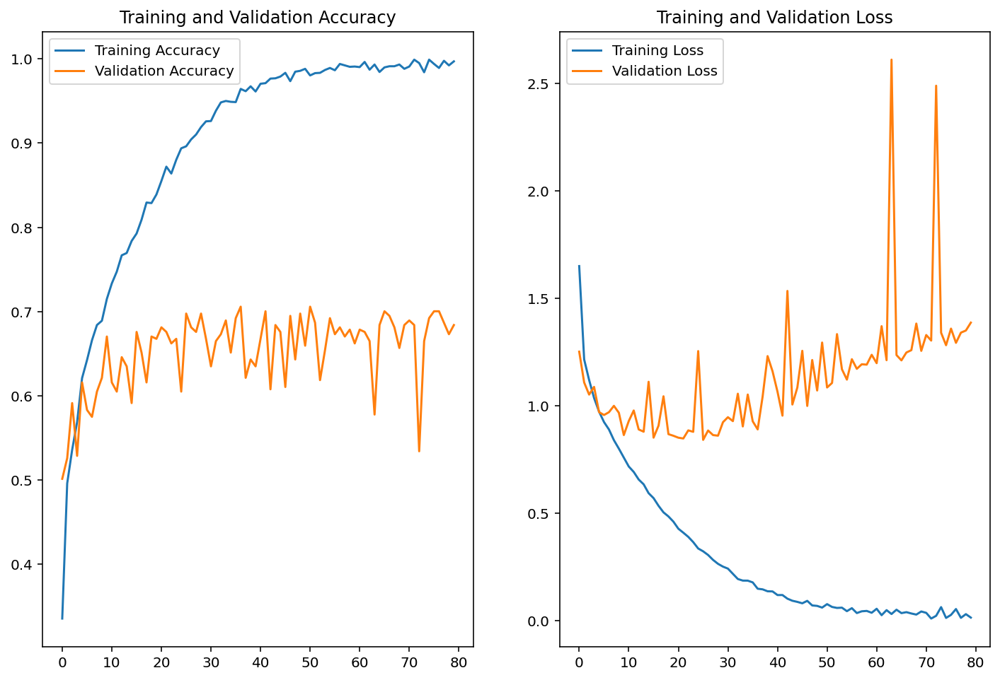

In [33]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [34]:
# 정확도 평가
test_loss, test_accuracy = model.evaluate(test_batches)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy * 100 :.2f} %")

6/6 [==============================] - 0s 12ms/step - loss: 1.2005 - accuracy: 0.7193
Test Loss: 1.2005
Test Accuracy: 71.93 %


#### 방법2. Adam, sparse_categorical_crossentropy, learning_rate = 0.0001

EPOCHS = 30   ->  Test Loss: 1.0288, Test Accuracy: 68.12 %

EPOCHS = 50   ->  Test Loss: 0.9288, Test Accuracy: 68.66 %

In [35]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])

learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [36]:
EPOCHS = 50
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/50
46/46 [==============================] - 3s 30ms/step - loss: 1.3988 - accuracy: 0.4050 - val_loss: 1.1755 - val_accuracy: 0.5041
Epoch 2/50
46/46 [==============================] - 2s 28ms/step - loss: 1.1209 - accuracy: 0.5399 - val_loss: 1.0607 - val_accuracy: 0.5886
Epoch 3/50
46/46 [==============================] - 2s 28ms/step - loss: 1.0314 - accuracy: 0.5879 - val_loss: 1.0340 - val_accuracy: 0.6022
Epoch 4/50
46/46 [==============================] - 2s 28ms/step - loss: 0.9808 - accuracy: 0.6141 - val_loss: 1.0259 - val_accuracy: 0.5886
Epoch 5/50
46/46 [==============================] - 3s 28ms/step - loss: 0.9342 - accuracy: 0.6393 - val_loss: 0.9820 - val_accuracy: 0.6076
Epoch 6/50
46/46 [==============================] - 3s 28ms/step - loss: 0.8817 - accuracy: 0.6683 - val_loss: 0.9637 - val_accuracy: 0.6185
Epoch 7/50
46/46 [==============================] - 2s 28ms/step - loss: 0.8483 - accuracy: 0.6836 - val_loss: 0.9582 - val_accuracy: 0.6267
Epoch 8/50
46

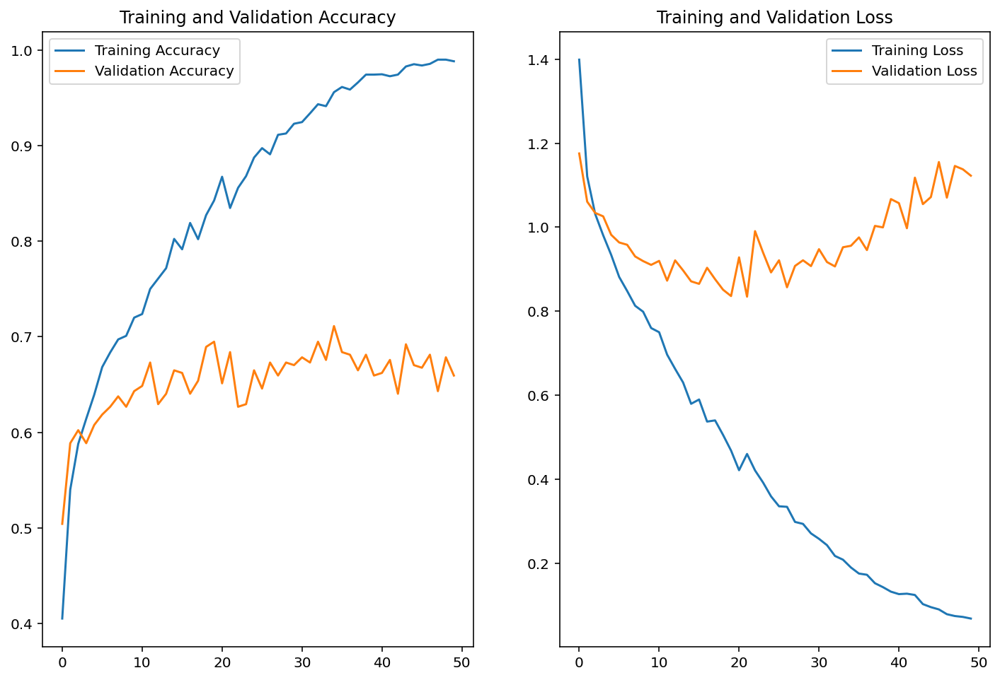

In [37]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [38]:
# 정확도 평가
test_loss, test_accuracy = model.evaluate(test_batches)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy * 100 :.2f} %")

6/6 [==============================] - 0s 12ms/step - loss: 0.9288 - accuracy: 0.6866
Test Loss: 0.9288
Test Accuracy: 68.66 %


In [41]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[6.75895171e-06, 3.09850725e-06, 9.86095071e-01, 1.02346018e-02,
        3.66049726e-03],
       [9.98098671e-01, 1.82600005e-03, 7.16996583e-05, 2.45429295e-08,
        3.58306193e-06],
       [6.96496069e-01, 6.48666034e-03, 4.78639156e-02, 2.42586032e-01,
        6.56734314e-03],
       [1.30552100e-03, 2.33583093e-01, 7.30742812e-01, 4.58099857e-05,
        3.43227871e-02],
       [8.53058159e-01, 3.09217013e-02, 2.06982391e-03, 5.87155693e-04,
        1.13363087e-01],
       [3.04325104e-01, 1.24716848e-01, 3.18609290e-02, 6.18159422e-04,
        5.38478971e-01],
       [5.51936246e-05, 8.86709895e-03, 9.44749355e-01, 9.40791324e-07,
        4.63274680e-02],
       [3.88044305e-02, 1.61823541e-01, 5.11459224e-02, 5.87249100e-02,
        6.89501166e-01],
       [1.83789361e-05, 7.21114546e-08, 4.23227975e-05, 9.99939084e-01,
        1.44021342e-07],
       [9.99999285e-01, 5.44138231e-07, 5.39876899e-09, 2.22550398e-11,
        1.14786936e-07],
       [9.99511719e-01, 2.6248

In [42]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([2, 0, 0, 2, 0, 4, 2, 4, 3, 0, 0, 0, 3, 4, 2, 3, 2, 3, 1, 4, 2, 0,
       2, 0, 1, 2, 2, 4, 2, 1, 0, 1, 2, 4, 2, 1, 2, 0, 0, 2, 4, 1, 3, 0,
       1, 3, 0, 0, 4, 2, 2, 0, 4, 1, 1, 4, 2, 1, 1, 2, 4, 3, 3, 1])

#### Step 3, 4  결과 시각화

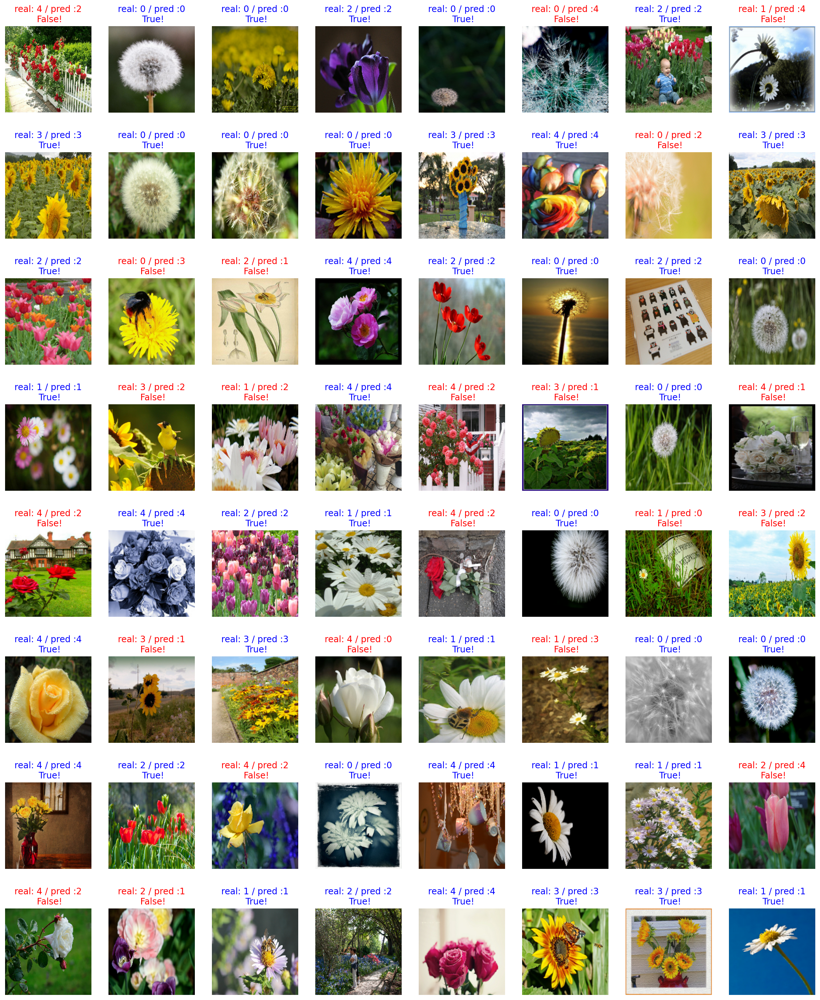

In [51]:
plt.figure(figsize=(20, 25))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(8, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

## 2. base 모델(VGG16)을 활용한 Transfer learning

In [70]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,  # 끝 3개의 FC 레이어는 제외
                                         weights='imagenet')

In [71]:
feature_batch = base_model(image_batch)
feature_batch.shape 

TensorShape([64, 5, 5, 512])

In [72]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

#### VGG16 끝단에 classifier 레이어를 붙여서 분류 모델 만들기

In [73]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [74]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)  

(64, 512)


In [75]:
import tensorflow as tf

# 첫 번째 Dense Layer (Global Average Pooling 이후)
dense_layer = tf.keras.layers.Dense(
    units=512,       # Global Average Pooling을 거친 후의 벡터 크기
    activation='relu'  # 활성화 함수: ReLU
)

# 두 번째 Dense Layer (출력층, 클래스 개수에 맞춤)
prediction_layer = tf.keras.layers.Dense(
    units=5,  # num_classes,   # 분류할 클래스 개수
    activation='softmax'  # 활성화 함수: Softmax (다중 분류)
)

# 예측 실행
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)  # 출력 형태 확인

(64, 5)


In [76]:
base_model.trainable = False

In [77]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

In [78]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 512)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_9 (Dense)              (None, 5)                 2565      
Total params: 14,979,909
Trainable params: 265,221
Non-trainable params: 14,714,688
_________________________________________________________________


#### VGG16을 기반으로 구성된 이미지 분류기 학습하기

#### Adam, sparse_categorical_crossentropy

##### 테스트 결과 1

- batch : 32,   learning_rate=0.0001

    - EPOCHS = 30   ->  Test Loss: 1.0288, Test Accuracy: 68.12 %

    - EPOCHS = 50   ->  Test Loss: 0.9288, Test Accuracy: 68.66 %
    
- batch : 64,  learning_rate=0.0001

    - EPOCHS = 50   ->  Test Loss: 0.4132, Test Accuracy: ** 85.83 % **

In [79]:
base_learning_rate = 0.0001

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [80]:
loss0, accuracy0 = model.evaluate(validation_batches)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

6/6 [==============================] - 1s 135ms/step - loss: 1.6298 - accuracy: 0.2752
initial loss: 1.63
initial accuracy: 0.28


In [82]:
model.save_weights('initial_weights.h5')   # 모델 초기화 활용

In [83]:
EPOCHS = 50

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/50
46/46 [==============================] - 9s 162ms/step - loss: 1.4902 - accuracy: 0.3879 - val_loss: 1.3148 - val_accuracy: 0.6213
Epoch 2/50
46/46 [==============================] - 9s 167ms/step - loss: 1.2189 - accuracy: 0.6420 - val_loss: 1.0919 - val_accuracy: 0.6839
Epoch 3/50
46/46 [==============================] - 9s 173ms/step - loss: 1.0399 - accuracy: 0.6928 - val_loss: 0.9455 - val_accuracy: 0.7139
Epoch 4/50
46/46 [==============================] - 9s 172ms/step - loss: 0.9168 - accuracy: 0.7316 - val_loss: 0.8499 - val_accuracy: 0.7275
Epoch 5/50
46/46 [==============================] - 9s 167ms/step - loss: 0.8336 - accuracy: 0.7456 - val_loss: 0.7847 - val_accuracy: 0.7411
Epoch 6/50
46/46 [==============================] - 9s 163ms/step - loss: 0.7728 - accuracy: 0.7643 - val_loss: 0.7297 - val_accuracy: 0.7439
Epoch 7/50
46/46 [==============================] - 9s 161ms/step - loss: 0.7253 - accuracy: 0.7732 - val_loss: 0.7057 - val_accuracy: 0.7411
Epoch 

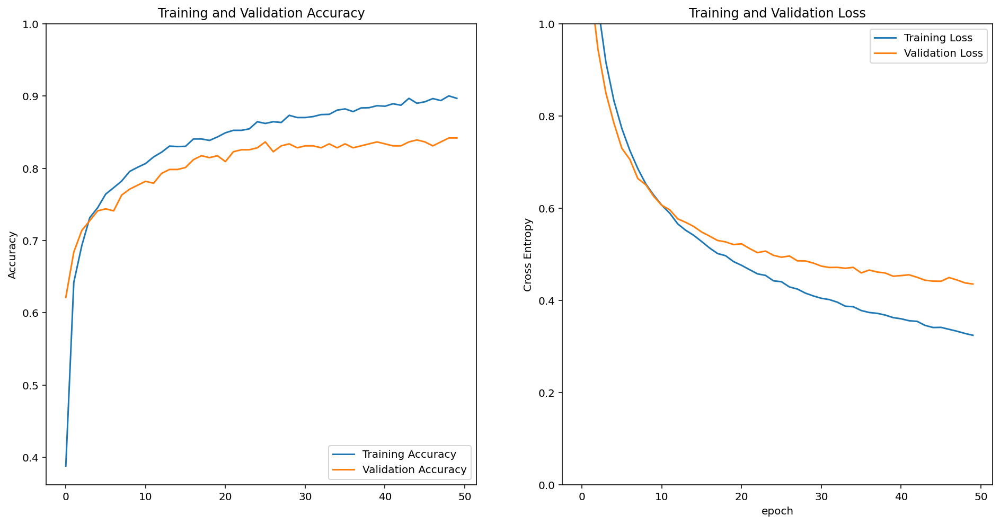

In [84]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [85]:
# 정확도 평가
test_loss, test_accuracy = model.evaluate(test_batches)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy * 100 :.2f} %")

6/6 [==============================] - 1s 129ms/step - loss: 0.4132 - accuracy: 0.8583
Test Loss: 0.4132
Test Accuracy: 85.83 %


##### 테스트 결과 2
    
- batch : 64,  learning_rate=0.0002

    - EPOCHS = 50   ->  Test Loss: 0.4026, Test Accuracy: ** 85.56 % **

In [86]:
model.load_weights('initial_weights.h5')   # fit후 모델 초기화

In [87]:
base_learning_rate = 0.0002

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [88]:
EPOCHS = 50

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/50
46/46 [==============================] - 9s 163ms/step - loss: 1.4839 - accuracy: 0.4009 - val_loss: 1.3167 - val_accuracy: 0.6294
Epoch 2/50
46/46 [==============================] - 9s 163ms/step - loss: 1.2178 - accuracy: 0.6417 - val_loss: 1.0907 - val_accuracy: 0.7030
Epoch 3/50
46/46 [==============================] - 9s 168ms/step - loss: 1.0373 - accuracy: 0.6993 - val_loss: 0.9442 - val_accuracy: 0.7275
Epoch 4/50
46/46 [==============================] - 9s 172ms/step - loss: 0.9185 - accuracy: 0.7296 - val_loss: 0.8548 - val_accuracy: 0.7248
Epoch 5/50
46/46 [==============================] - 9s 172ms/step - loss: 0.8340 - accuracy: 0.7428 - val_loss: 0.7890 - val_accuracy: 0.7411
Epoch 6/50
46/46 [==============================] - 9s 165ms/step - loss: 0.7711 - accuracy: 0.7595 - val_loss: 0.7357 - val_accuracy: 0.7439
Epoch 7/50
46/46 [==============================] - 9s 163ms/step - loss: 0.7239 - accuracy: 0.7742 - val_loss: 0.6918 - val_accuracy: 0.7520
Epoch 

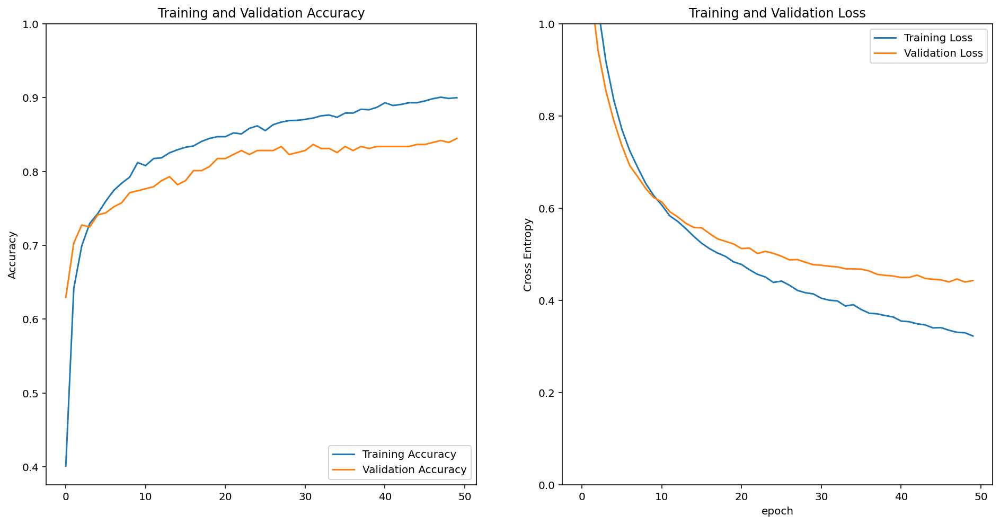

In [90]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [89]:
# 정확도 평가
test_loss, test_accuracy = model.evaluate(test_batches)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy * 100 :.2f} %")


6/6 [==============================] - 1s 133ms/step - loss: 0.4026 - accuracy: 0.8556
Test Loss: 0.4026
Test Accuracy: 85.56 %


In [94]:
model.save('flowers_model_vgg_85_56.h5')

## 3. 후기

    - 단순 반복의 연속으로 작업 시간내내 MLops 학습의 필요성 절감.
    - 향후 활용성을 고려하여 보다 가벼운 온디바이스 모델 개발에 중점을 둔 학습 견지
    - 사진 보다는 영상을 통한 리얼타임 분류기술의 학습 필요  